In [1]:
%cd ..
%ls

/home/nas3_userJ/dmkim/OnlineTSAD
cfgs/         EDA/      hptune/  outputs/  test.py*       utils/
checkpoints/  Exp/      logs/    plots/    thresholding/  Vis/
data/         figures/  models/  results/  train.py*      wandb/


In [2]:
import torch
from torch import optim
import torch.nn.functional as F

import matplotlib.pyplot as plt

from utils.metrics import get_summary_stats

from models.MLP import MLP

import wandb
import hydra
from omegaconf import DictConfig

from utils.logger import make_logger
from utils.argpass import prepare_arguments, configure_exp_id
from utils.tools import SEED_everything, plot_interval

import warnings
from data.load_data import DataFactory
from Exp.ReconBaselines import *

from easydict import EasyDict as edict
import yaml
import re
import copy

warnings.filterwarnings("ignore")

In [3]:
# load yaml
cfg = {}
loader = yaml.SafeLoader
loader.add_implicit_resolver(
    u'tag:yaml.org,2002:float',
    re.compile(u'''^(?:
     [-+]?(?:[0-9][0-9_]*)\\.[0-9_]*(?:[eE][-+]?[0-9]+)?
    |[-+]?(?:[0-9][0-9_]*)(?:[eE][-+]?[0-9]+)
    |\\.[0-9_]+(?:[eE][-+][0-9]+)?
    |[-+]?[0-9][0-9_]*(?::[0-5]?[0-9])+\\.[0-9_]*
    |[-+]?\\.(?:inf|Inf|INF)
    |\\.(?:nan|NaN|NAN))$''', re.X),
    list(u'-+0123456789.'))

# get cfg
model = "MLP"
with open("cfgs/test_defaults.yaml", "r") as file:
    basic_config = yaml.load(file, Loader=loader)
    cfg.update(basic_config)
with open(f"cfgs/model/{model}.yaml", "r") as file:
    model_config = yaml.load(file, Loader=loader)
    cfg.update({"model": model_config})
cfg['dataset'] = 'NeurIPS-TS-UNI'
cfg["normalization"] = 'SlowRevIN'
cfg["gamma"] = 0.9

In [4]:
args = prepare_arguments(cfg)
args.model.latent_dim = 16
args.window_size = 10
args.stride = 10
args.eval_stride = 10
args.eval_batch_size = 1
args.dataset = "NeurIPS-TS-UNI"
print(args)

logger = make_logger(os.path.join(args.log_path, f'{args.exp_id}.log'))
logger.info(f"Configurations: {args}")

# Data
logger.info(f"Preparing {args.dataset} dataset...")
datafactory = DataFactory(args, logger)
train_dataset, train_loader, test_dataset, test_loader = datafactory()
args.num_channels = train_dataset.X.shape[1]
train_X, train_y, test_X, test_y = train_dataset.X, train_dataset.y, test_dataset.X, test_dataset.y

print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

[2023-05-01 20:31:48,657] Configurations: {'exp_id': 'MLP_NeurIPS-TS-UNI_normalization_SlowRevIN', 'infer_options': ['offline_all'], 'thresholding': 'None', 'tau_beta': 0.99, 'qStart': 0.9, 'qEnd': 1.0, 'qStep': 0.01, 'dataset': 'NeurIPS-TS-UNI', 'batch_size': 64, 'eval_batch_size': 1, 'window_size': 10, 'stride': 10, 'eval_stride': 10, 'scaler': 'std', 'load_previous_error': True, 'lr': 0.001, 'epochs': 30, 'ttlr': 0.001, 'normalization': 'SlowRevIN', 'gamma': 0.9, 'log_freq': 10, 'checkpoint_path': './checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN', 'log_path': './logs/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN', 'output_path': './outputs/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN', 'plot_path': './plots/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN', 'result_path': './results/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN', 'plot_anomaly_scores': True, 'plot_recon_status': False, 'defaults': [{'model': 'MLP'}], 'model': {'name': 'MLP', 'latent_dim': 16}, 'home_dir': '.', 'device': 

{'exp_id': 'MLP_NeurIPS-TS-UNI_normalization_SlowRevIN', 'infer_options': ['offline_all'], 'thresholding': 'None', 'tau_beta': 0.99, 'qStart': 0.9, 'qEnd': 1.0, 'qStep': 0.01, 'dataset': 'NeurIPS-TS-UNI', 'batch_size': 64, 'eval_batch_size': 1, 'window_size': 10, 'stride': 10, 'eval_stride': 10, 'scaler': 'std', 'load_previous_error': True, 'lr': 0.001, 'epochs': 30, 'ttlr': 0.001, 'normalization': 'SlowRevIN', 'gamma': 0.9, 'log_freq': 10, 'checkpoint_path': './checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN', 'log_path': './logs/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN', 'output_path': './outputs/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN', 'plot_path': './plots/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN', 'result_path': './results/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN', 'plot_anomaly_scores': True, 'plot_recon_status': False, 'defaults': [{'model': 'MLP'}], 'model': {'name': 'MLP', 'latent_dim': 16}, 'home_dir': '.', 'device': device(type='cuda')}
(10000, 1) (10000,) (

## Visualize

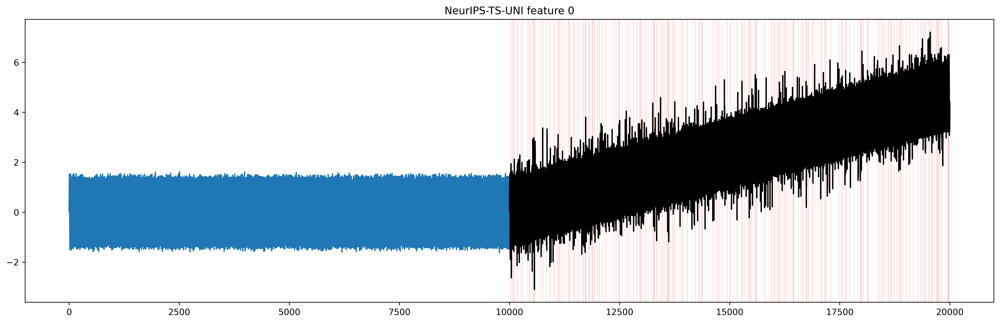

In [5]:
for c in range(args.num_channels):
    dataset_name = "NeurIPS-TS-UNI"
    plt.figure(figsize=(20, 6), dpi=500)
    plt.plot(train_X[:, c], color="C0")
    plt.plot(range(len(train_X), len(train_X)+len(test_X)), test_X[:, c], color="black")
    label = np.concatenate([np.array([0]*len(train_X)), test_y])
    plot_interval(plt, label)
    plt.title(f"{dataset_name} feature {c}")
    plt.show()

## Load Model

In [6]:
tester = MLP_Tester(
    args=args,
    logger=logger,
    train_loader=train_loader,
    test_loader=test_loader,
)
tester.load(os.path.join("./checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN", f"best.pth"))

[2023-05-01 20:31:57,464] loading: ./checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict
[2023-05-01 20:31:57,478] train_errors.pt file exists, loading...
[2023-05-01 20:31:57,479] torch.Size([1000, 10])
[2023-05-01 20:31:57,480] test_errors.pt file exists, loading...
[2023-05-01 20:31:57,482] torch.Size([1000, 10])
[2023-05-01 20:31:57,486] loading: ./checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict


## Training statistics

In [7]:
train_iterator = tqdm(
    tester.train_loader,
    total=len(tester.train_loader),
    desc="calculating reconstruction errors",
    leave=True
)

recon_errors = []
with torch.no_grad():
    for i, batch_data in enumerate(train_iterator):
        X = batch_data[0].to(args.device)
        B, L, C = X.shape
        Xhat = tester.model(X)
        recon_error = torch.nn.functional.mse_loss(Xhat, X, reduction='none')
        recon_errors.append(recon_error)

recon_errors = torch.cat(recon_errors, axis=0)
recon_errors = recon_errors.reshape(-1, args.num_channels)
train_error_dist = recon_errors.mean(dim=1)

print(f"{recon_errors.shape}, {train_error_dist.shape}")

calculating reconstruction errors: 100%|██████████| 16/16 [00:00<00:00, 78.22it/s]

torch.Size([10000, 1]), torch.Size([10000])


In [8]:
th = torch.quantile(train_error_dist, 0.995).item()
th

0.03909923881292343

## Test: static threshold inference

In [9]:
eval_iterator = tqdm(
    tester.test_loader,
    total=len(tester.test_loader),
    desc="calculating reconstruction errors",
    leave=True
)

anoscs_prev = []
Xhats_prev = []

Zs = []
Zyt = []
Zy = []

with torch.no_grad():
    for i, batch_data in enumerate(eval_iterator):
        X, y = batch_data[0].to(args.device), batch_data[1].to(args.device)
        B, L, C = X.shape
        Xhat = tester.model(X)
        Xhats_prev.append(Xhat)
        
#         E = (Xhat-X)**2
#         A = E.mean(dim=2)
#         ytilde = (A > th).float()
        
#         with torch.no_grad():
#             z = tester.model.encoder(_nX.reshape(B, L*C))
#             zytilde = np.array([1 in ytilde])
#             zy = np.array([1 in y])
#             Zs.append(z)
#             Zyt.append(zytilde)
#             Zy.append(zy)
        
        
        e = F.mse_loss(Xhat, X, reduction='none')
        anosc = e.mean(dim=2)
        anoscs_prev.append(anosc)

Xhats_prev = torch.cat(Xhats_prev, axis=0).detach().cpu().numpy()
anoscs_prev = torch.cat(anoscs_prev, axis=0).reshape(-1).detach().cpu().numpy()
# Zs = torch.cat(Zs, axis=0).cpu().numpy()
# Zyt = np.stack(Zyt)
# Zy = np.stack(Zy)

calculating reconstruction errors: 100%|██████████| 1000/1000 [00:00<00:00, 1823.01it/s]


In [10]:
anoscs_prev.shape

(10000,)

In [11]:
th_q95 = torch.quantile(train_error_dist, 0.95).item()
th_q99 = torch.quantile(train_error_dist, 0.99).item()
th_q100 = torch.max(train_error_dist).item()
th_best_static = get_best_static_threshold(gt=test_y, anomaly_scores=anoscs_prev)
th_q95, th_q99, th_q100, th_best_static

(0.019320784136652946, 0.03368188068270683, 0.08613139390945435, 0.9188737)

In [12]:

cols = ["tau", "Accuracy", "Precision", "Recall", "F1", "tn", "fp", "fn", "tp"]
cols += ["Accuracy_PA", "Precision_PA", "Recall_PA", "F1_PA", "tn_PA", "fp_PA", "fn_PA", "tp_PA"]
result_df = pd.DataFrame([], columns=cols)

# 95
result = pd.DataFrame([get_summary_stats(test_dataset.y, anoscs_prev > th_q95)], index=["Q95"], columns=result_df.columns)
result_df = pd.concat([result_df, result])


# 99
result = pd.DataFrame([get_summary_stats(test_dataset.y, anoscs_prev > th_q99)], index=["Q99"], columns=result_df.columns)
result_df = pd.concat([result_df, result])

# 100
result = pd.DataFrame([get_summary_stats(test_dataset.y, anoscs_prev > th_q100)], index=["Q100"], columns=result_df.columns)
result_df = pd.concat([result_df, result])

# oracle
result = pd.DataFrame([get_summary_stats(test_dataset.y, anoscs_prev > th_best_static)], index=["Qbest"], columns=result_df.columns)
result_df = pd.concat([result_df, result])

result_df.to_csv("./Vis/results/off_NTSUNI.csv")

In [13]:
print(result_df)

       tau  Accuracy  Precision    Recall        F1    tn    fp   fn   tp  \
Q95    NaN    0.2023   0.098274  0.909091  0.177374  1163  7891   86  860   
Q99    NaN    0.2358   0.099809  0.882664  0.179338  1523  7531  111  835   
Q100   NaN    0.3098   0.103989  0.826638  0.184739  2316  6738  164  782   
Qbest  NaN    0.6184   0.123952  0.500000  0.198656  5711  3343  473  473   

       Accuracy_PA  Precision_PA  Recall_PA     F1_PA tn_PA fp_PA fn_PA tp_PA  
Q95         0.2034      0.099407   0.920719  0.179440  1163  7891    75   871  
Q99         0.2372      0.101313   0.897463  0.182072  1523  7531    97   849  
Q100        0.3116      0.106129   0.845666  0.188590  2316  6738   146   800  
Qbest       0.6208      0.129427   0.525370  0.207689  5711  3343   449   497  


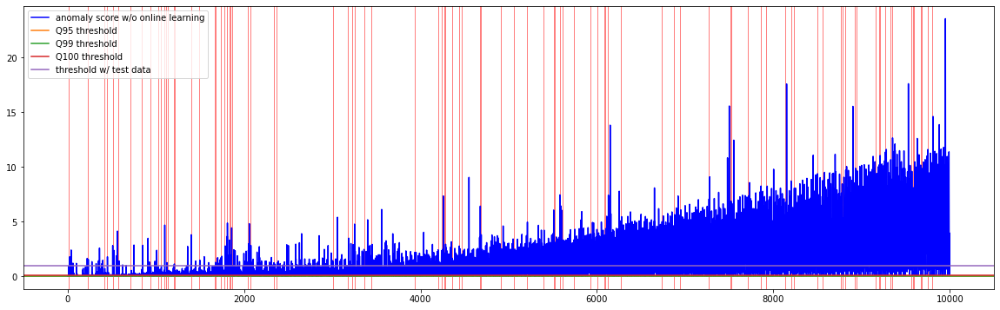

In [14]:
plt.figure(figsize=(20, 6))
#lt.ylim([-2, 5])
plt.plot(anoscs_prev, color="blue", label="anomaly score w/o online learning")
#plt.plot(anoscs, color="green", label="anomaly score w/ online learning")
plt.axhline(th_q95, color="C1", label="Q95 threshold")
plt.axhline(th_q99, color="C2", label="Q99 threshold")
plt.axhline(th_q100, color="C3", label="Q100 threshold")
plt.axhline(th_best_static, color="C4", label="threshold w/ test data")

#plt.plot(thrs, color="gold",label="dynamic threshold")
plt.legend()
plot_interval(plt, test_y)
plt.show()

## assume that trend is known

In [15]:
tester = MLP_Tester(
    args=args,
    logger=logger,
    train_loader=train_loader,
    test_loader=test_loader,
)
tester.load(os.path.join("./checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN", f"best.pth"))

[2023-05-01 20:32:18,208] loading: ./checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict
[2023-05-01 20:32:18,211] train_errors.pt file exists, loading...
[2023-05-01 20:32:18,213] torch.Size([1000, 10])
[2023-05-01 20:32:18,213] test_errors.pt file exists, loading...
[2023-05-01 20:32:18,215] torch.Size([1000, 10])
[2023-05-01 20:32:18,218] loading: ./checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict


In [16]:
trend = np.linspace(0, 5, 10000)

In [17]:
eval_iterator = tqdm(
    tester.test_loader,
    total=len(tester.test_loader),
    desc="calculating reconstruction errors",
    leave=True
)

anoscs_prev = []
Xhats_prev = []

Zs = []
Zyt = []
Zy = []
Xmus = []


th = 0.19628921
with torch.no_grad():
    for i, batch_data in enumerate(eval_iterator):
        X, y = batch_data[0].to(args.device), batch_data[1].to(args.device)
        B, L, C = X.shape
        tr = torch.Tensor(trend[i*L:i*L+L]).reshape(B, L, C).to(args.device)
        tester.model.normalizer._set_statistics(tr)
        Xhat = tester.model(X)
        Xhats_prev.append(Xhat)
        
        
                
        E = (Xhat-X)**2
        A = E.mean(dim=2)
        ytilde = (A > th).float()
        
        with torch.no_grad():
            _nX = tester.model.normalizer(X, "norm")
            z = tester.model.encoder(_nX.reshape(B, L*C))
            zytilde = np.array([1 in ytilde])
            zy = np.array([1 in y])
            Zs.append(z)
            Zyt.append(zytilde)
            Zy.append(zy)
        
        
        
        
        
        Xmus.append(tester.model.normalizer.mean.clone().detach())
        
        e = F.mse_loss(Xhat, X, reduction='none')
        anosc = e.mean(dim=2)
        anoscs_prev.append(anosc)

Xhats_prev = torch.cat(Xhats_prev, axis=0).detach().cpu().numpy()
anoscs_prev = torch.cat(anoscs_prev, axis=0).reshape(-1).detach().cpu().numpy()

Xmus = torch.cat(Xmus, axis=0).detach().cpu().numpy().reshape(-1, args.num_channels)

Zs = torch.cat(Zs, axis=0).cpu().numpy()
Zyt = np.stack(Zyt)
Zy = np.stack(Zy).squeeze(1)


calculating reconstruction errors: 100%|██████████| 1000/1000 [00:01<00:00, 951.64it/s]


In [18]:
th_q95 = torch.quantile(train_error_dist, 0.95).item()
th_q99 = torch.quantile(train_error_dist, 0.99).item()
th_q100 = torch.max(train_error_dist).item()
th_best_static = get_best_static_threshold(gt=test_y, anomaly_scores=anoscs_prev)
th_q95, th_q99, th_q100, th_best_static

(0.019320784136652946, 0.03368188068270683, 0.08613139390945435, 0.19628921)

In [19]:
cols = ["tau", "Accuracy", "Precision", "Recall", "F1", "tn", "fp", "fn", "tp"]
cols += ["Accuracy_PA", "Precision_PA", "Recall_PA", "F1_PA", "tn_PA", "fp_PA", "fn_PA", "tp_PA"]
result_df = pd.DataFrame([], columns=cols)

# 95
result = pd.DataFrame([get_summary_stats(test_dataset.y, anoscs_prev > th_q95)], index=["Q95"], columns=result_df.columns)
result_df = pd.concat([result_df, result])


# 99
result = pd.DataFrame([get_summary_stats(test_dataset.y, anoscs_prev > th_q99)], index=["Q99"], columns=result_df.columns)
result_df = pd.concat([result_df, result])

# 100
result = pd.DataFrame([get_summary_stats(test_dataset.y, anoscs_prev > th_q100)], index=["Q100"], columns=result_df.columns)
result_df = pd.concat([result_df, result])

# oracle
result = pd.DataFrame([get_summary_stats(test_dataset.y, anoscs_prev > th_best_static)], index=["Qbest"], columns=result_df.columns)
result_df = pd.concat([result_df, result])

result_df.to_csv("./Vis/results/off_sr_NTSUNI.csv")

In [20]:
# 95
print(get_summary_stats(test_dataset.y, anoscs_prev > th_q95))
# 99
print(get_summary_stats(test_dataset.y, anoscs_prev > th_q99))
# 100
print(get_summary_stats(test_dataset.y, anoscs_prev > th_q100))
# oracle
print(get_summary_stats(test_dataset.y, anoscs_prev > th_best_static))

{'Accuracy': 0.6031, 'Precision': 0.17997035782341733, 'Recall': 0.8985200845665962, 'F1': 0.2998765214323514, 'tn': 5181, 'fp': 3873, 'fn': 96, 'tp': 850, 'Accuracy_PA': 0.6046, 'Precision_PA': 0.18256648374841705, 'Recall_PA': 0.9143763213530656, 'F1_PA': 0.30436312456016884, 'tn_PA': 5181, 'fp_PA': 3873, 'fn_PA': 81, 'tp_PA': 865}
{'Accuracy': 0.7089, 'Precision': 0.22866611433305717, 'Recall': 0.8752642706131079, 'F1': 0.36260126998029346, 'tn': 6261, 'fp': 2793, 'fn': 118, 'tp': 828, 'Accuracy_PA': 0.7105, 'Precision_PA': 0.2320593896068188, 'Recall_PA': 0.8921775898520085, 'F1_PA': 0.3683176958324242, 'tn_PA': 6261, 'fp_PA': 2793, 'fn_PA': 102, 'tp_PA': 844}
{'Accuracy': 0.88, 'Precision': 0.42857142857142855, 'Recall': 0.8054968287526427, 'F1': 0.5594713656387665, 'tn': 8038, 'fp': 1016, 'fn': 184, 'tp': 762, 'Accuracy_PA': 0.8826, 'Precision_PA': 0.43680709534368073, 'Recall_PA': 0.8329809725158562, 'F1_PA': 0.5730909090909091, 'tn_PA': 8038, 'fp_PA': 1016, 'fn_PA': 158, 'tp_PA

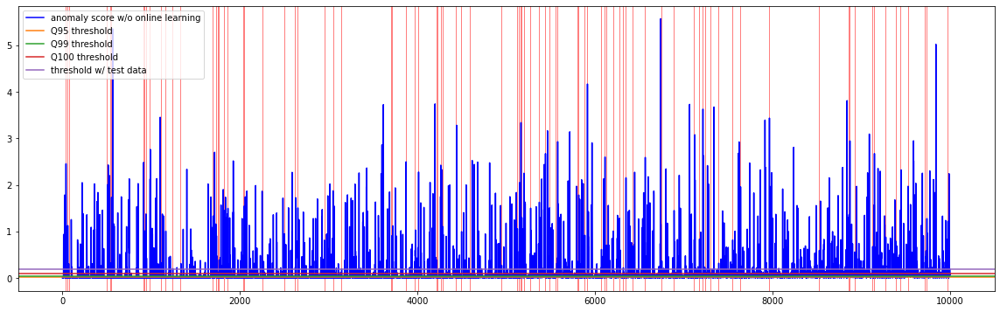

In [21]:
plt.figure(figsize=(20, 6))
#lt.ylim([-2, 5])
plt.plot(anoscs_prev, color="blue", label="anomaly score w/o online learning")
#plt.plot(anoscs, color="green", label="anomaly score w/ online learning")
plt.axhline(th_q95, color="C1", label="Q95 threshold")
plt.axhline(th_q99, color="C2", label="Q99 threshold")
plt.axhline(th_q100, color="C3", label="Q100 threshold")
plt.axhline(th_best_static, color="C4", label="threshold w/ test data")

#plt.plot(thrs, color="gold",label="dynamic threshold")
plt.legend()
plot_interval(plt, test_y)
plt.show()

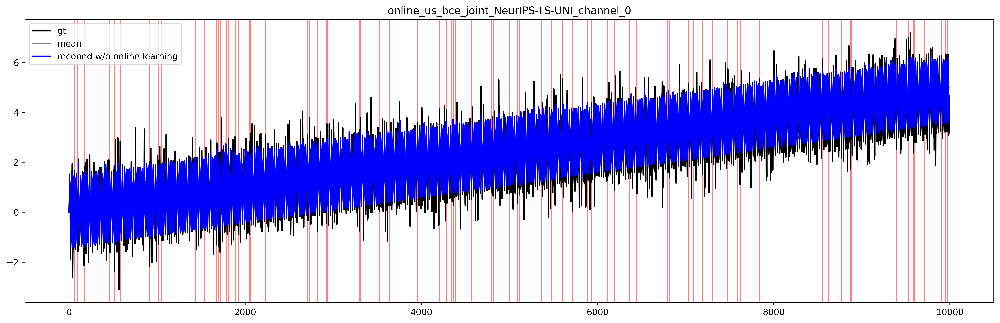

In [22]:
# plot recon
c = 0
for c in range(args.num_channels):
    test_X, test_y = test_dataset.X, test_dataset.y

    B, L, C = Xhats_prev.shape

    plt.figure(figsize=(20, 6), dpi=500)
    plt.title(f"online_us_bce_joint_{args.dataset}_channel_{c}")

    plt.plot(test_X[:, c], color="black", label="gt")
    plt.plot(Xmus[:, c], color="C7", label="mean")
    
    plt.plot(Xhats_prev[:,:,c].reshape(-1), color="blue", label="reconed w/o online learning")
    #plt.plot(Xhats[:,:,c].reshape(-1), color="green", label="reconed w/ online learning")
    plt.legend()
    plot_interval(plt, test_y)
    break

In [23]:
Zs_before = Zs.copy()
Zy_before = Zy.copy()
Zyt_before = Zyt.copy()

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.000s...
[t-SNE] Computed neighbors for 1000 samples in 0.020s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.330551
[t-SNE] KL divergence after 300 iterations: 1.008228


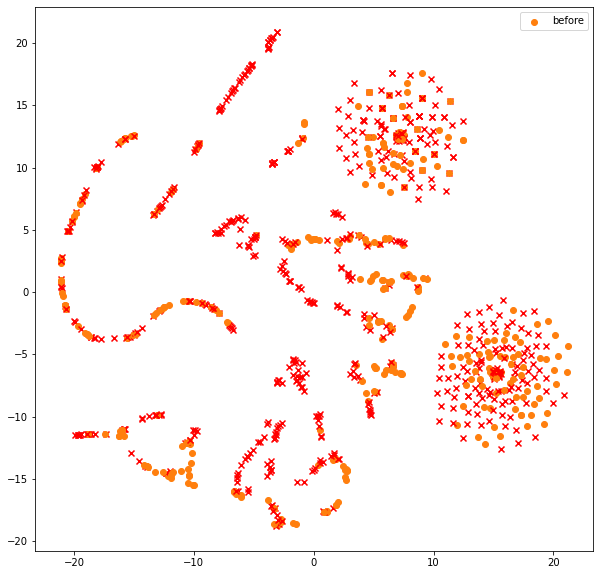

In [24]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, n_iter=300, perplexity=10)
tsne_v = tsne.fit_transform(Zs.astype("float64"))

tx = tsne_v[:, 0]
ty = tsne_v[:, 1]
plt.figure(figsize=(10, 10))

markers = ["o", "x"]
colors = ["C1", "red"]
# before
for x, y, label in zip(tx, ty, Zy):
    plt.scatter(x, y, color=colors[label], marker=markers[label], label="_hidden")
plt.scatter(x, y, color=colors[label], marker=markers[label], label="before")

plt.legend()
plt.show()

## normality learning.

[2023-05-01 20:48:50,279] loading: ./checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict
[2023-05-01 20:48:50,294] train_errors.pt file exists, loading...
[2023-05-01 20:48:50,296] torch.Size([1000, 10])
[2023-05-01 20:48:50,297] test_errors.pt file exists, loading...
[2023-05-01 20:48:50,298] torch.Size([1000, 10])
[2023-05-01 20:48:50,302] loading: ./checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict
calculating reconstruction errors: 100%|██████████| 1000/1000 [00:03<00:00, 287.35it/s]


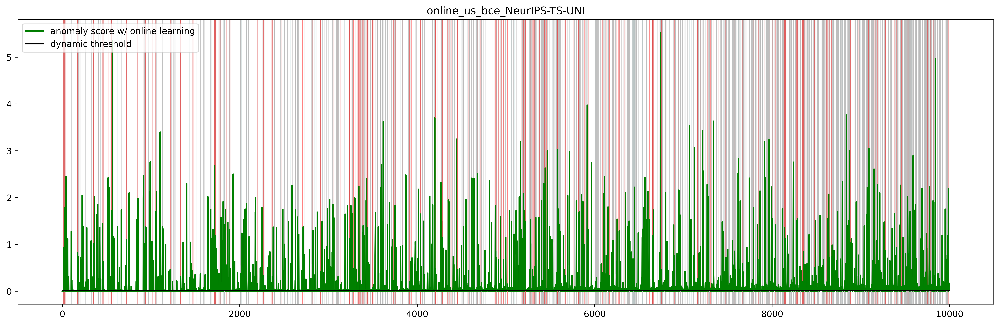

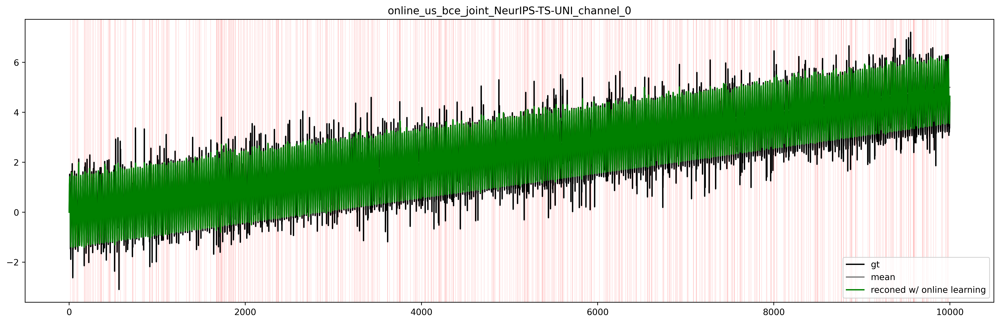

[2023-05-01 20:49:03,703] loading: ./checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict
[2023-05-01 20:49:03,707] train_errors.pt file exists, loading...
[2023-05-01 20:49:03,708] torch.Size([1000, 10])
[2023-05-01 20:49:03,709] test_errors.pt file exists, loading...
[2023-05-01 20:49:03,710] torch.Size([1000, 10])
[2023-05-01 20:49:03,714] loading: ./checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict
calculating reconstruction errors: 100%|██████████| 1000/1000 [00:03<00:00, 278.88it/s]


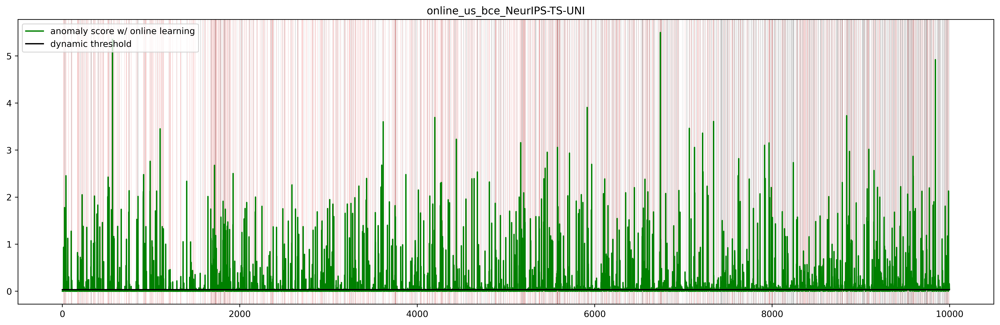

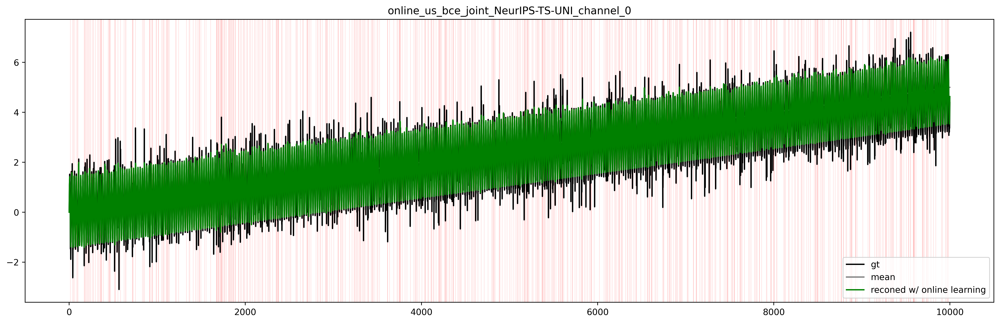

[2023-05-01 20:49:16,739] loading: ./checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict
[2023-05-01 20:49:16,745] train_errors.pt file exists, loading...
[2023-05-01 20:49:16,746] torch.Size([1000, 10])
[2023-05-01 20:49:16,748] test_errors.pt file exists, loading...
[2023-05-01 20:49:16,750] torch.Size([1000, 10])
[2023-05-01 20:49:16,757] loading: ./checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict
calculating reconstruction errors: 100%|██████████| 1000/1000 [00:03<00:00, 282.72it/s]


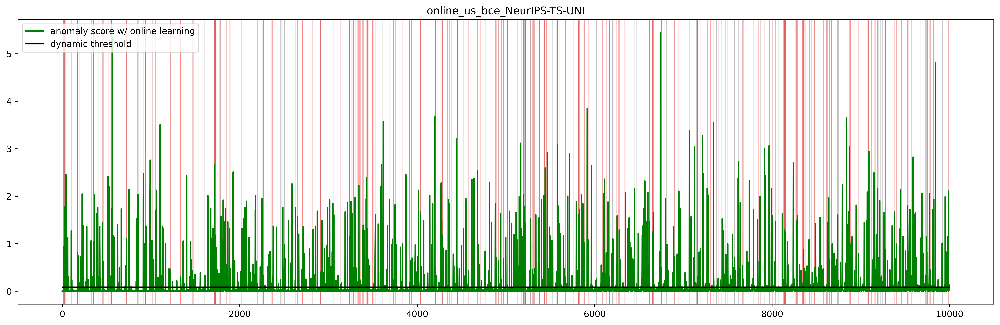

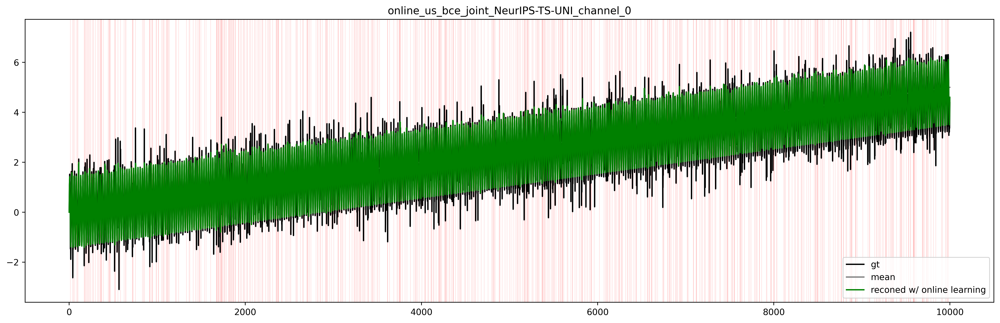

[2023-05-01 20:49:28,610] loading: ./checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict
[2023-05-01 20:49:28,613] train_errors.pt file exists, loading...
[2023-05-01 20:49:28,614] torch.Size([1000, 10])
[2023-05-01 20:49:28,615] test_errors.pt file exists, loading...
[2023-05-01 20:49:28,616] torch.Size([1000, 10])
[2023-05-01 20:49:28,620] loading: ./checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict
calculating reconstruction errors: 100%|██████████| 1000/1000 [00:03<00:00, 283.63it/s]


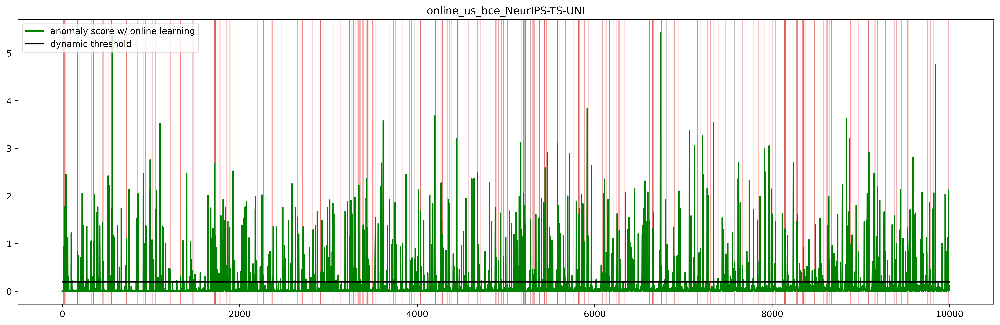

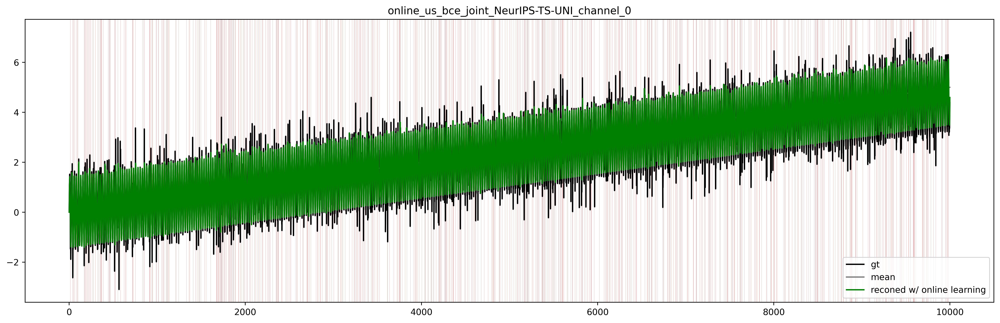

       tau  Accuracy  Precision    Recall        F1    tn    fp   fn   tp  \
Q95    NaN    0.6513   0.202110  0.911205  0.330839  5651  3403   84  862   
Q99    NaN    0.7626   0.267880  0.871036  0.409746  6802  2252  122  824   
Q100   NaN    0.9308   0.599219  0.810782  0.689128  8541   513  179  767   
Qbest  NaN    0.9601   0.853816  0.697674  0.767888  8941   113  286  660   

       Accuracy_PA  Precision_PA  Recall_PA     F1_PA tn_PA fp_PA fn_PA tp_PA  
Q95         0.6529      0.205092   0.928118  0.335948  5651  3403    68   878  
Q99         0.7642      0.271669   0.887949  0.416048  6802  2252   106   840  
Q100        0.9332      0.606595   0.836152  0.703111  8541   513   155   791  
Qbest       0.9637      0.860321   0.735729  0.793162  8941   113   250   696  


In [23]:
trend = np.linspace(0, 5, 10000)
cols = ["tau", "Accuracy", "Precision", "Recall", "F1", "tn", "fp", "fn", "tp"]
cols += ["Accuracy_PA", "Precision_PA", "Recall_PA", "F1_PA", "tn_PA", "fp_PA", "fn_PA", "tp_PA"]
result_df = pd.DataFrame([], columns=cols)

idxes = ["Q95", "Q99", "Q100", "Qbest"]

for j, th in enumerate([th_q95, th_q99, th_q100, th_best_static]):
    tester = MLP_Tester(
        args=args,
        logger=logger,
        train_loader=train_loader,
        test_loader=test_loader,
    )
    tester.load(os.path.join("./checkpoints/MLP_NeurIPS-TS-UNI_normalization_SlowRevIN", f"best.pth"))
    
    
    eval_iterator = tqdm(
        tester.test_loader,
        total=len(tester.test_loader),
        desc="calculating reconstruction errors",
        leave=True
    )


    lr = 0.001
    TT_optimizer = torch.optim.SGD([p for p in tester.model.parameters()], lr=lr)

    Xs, Xhats = [], []
    Xmus = []
    yhats = []
    preds = []
    As, thrs =[], []

    Zs = []
    Zyt = []
    Zy = []
    
    for i, batch_data in enumerate(eval_iterator):
        X, y = batch_data[0].to(args.device), batch_data[1].to(args.device)
        B, L, C = X.shape
        tr = torch.Tensor(trend[i*L:i*L+L]).reshape(B, L, C).to(args.device)
        tester.model.normalizer._set_statistics(tr)
        

        Xhat = tester.model(X)
        E = (Xhat-X)**2
        A = E.mean(dim=2)
        ytilde = (A > th).float()
        pred = ytilde

        
        
        with torch.no_grad():
            _nX = tester.model.normalizer(X, "norm")
            z = tester.model.encoder(_nX.reshape(B, L*C))
            zytilde = np.array([1 in ytilde])
            zy = np.array([1 in y])
            Zs.append(z)
            Zyt.append(zytilde)
            Zy.append(zy)
        
        
        
        Xs.append(X)
        Xmus.append(tester.model.normalizer.mean.clone().detach())
        Xhats.append(Xhat.clone().detach())
        As.append(A.clone().detach())
        preds.append(pred.clone().detach())
        thrs.append(th)

        # learn new-normals
        TT_optimizer.zero_grad()
        mask = (ytilde == 0)
        recon_loss = (A*mask).mean()
        recon_loss.backward()
        TT_optimizer.step()


    Xs = torch.cat(Xs, axis=0).detach().cpu().numpy()    
    Xhats = torch.cat(Xhats, axis=0).detach().cpu().numpy()
    Xmus = torch.cat(Xmus, axis=0).detach().cpu().numpy().reshape(-1, args.num_channels)

    anoscs = torch.cat(As, axis=0).reshape(-1).detach().cpu().numpy()
    thrs = np.repeat(np.array(thrs), args.window_size*args.eval_batch_size)
    preds = torch.cat(preds).reshape(-1).detach().cpu().numpy()
    
    
    result = pd.DataFrame([get_summary_stats(test_dataset.y, preds)], index=[f"{idxes[j]}"], columns=result_df.columns)
    result_df = pd.concat([result_df, result])
    
    
    Zs = torch.cat(Zs, axis=0).cpu().numpy()
    Zyt = np.stack(Zyt)
    Zy = np.stack(Zy).squeeze(1)
    
    
    #s, e = 26751, 26851
    s, e = 0, -1
    plt.figure(figsize=(20, 6), dpi=500)
    plt.title(f"online_us_bce_{args.dataset}")
    #plt.ylim([-1, 10])
    #plt.plot(anoscs_prev[s:e], color="blue", label="anomaly score w/o online learning")
    plt.plot(anoscs[s:e], color="green", label="anomaly score w/ online learning")
    #plt.axhline(th_q95, color="purple", label="train 95% threshold")
    plt.plot(thrs[s:e], color="black",label="dynamic threshold")

    plot_interval(plt, preds.astype(int)[s:e], facecolor="gray", alpha=0.5)
    plot_interval(plt, test_y[s:e])
    plt.legend()
    plt.show()
    
    # plot recon
    c = 0
    for c in range(args.num_channels):
        test_X, test_y = test_dataset.X, test_dataset.y

        B, L, C = Xhats.shape

        plt.figure(figsize=(20, 6), dpi=500)
        plt.title(f"online_us_bce_joint_{args.dataset}_channel_{c}")

        plt.plot(test_X[:, c], color="black", label="gt")
        plt.plot(Xmus[:, c], color="C7", label="mean")

        #plt.plot(Xhats_prev[:,:,c].reshape(-1), color="blue", label="reconed w/o online learning")
        plt.plot(Xhats[:,:,c].reshape(-1), color="green", label="reconed w/ online learning")
        plt.legend()
        plot_interval(plt, test_y)
        plt.show()
print(result_df)
result_df.to_csv("./Vis/results/on_sr_NTSUNI.csv")

In [25]:
Xhats_prev.shape

(1000, 10, 1)

In [26]:
test_X.shape

(10000, 1)

In [27]:
Xhats.shape

(1000, 10, 1)

In [34]:
preds.shape

(10000,)

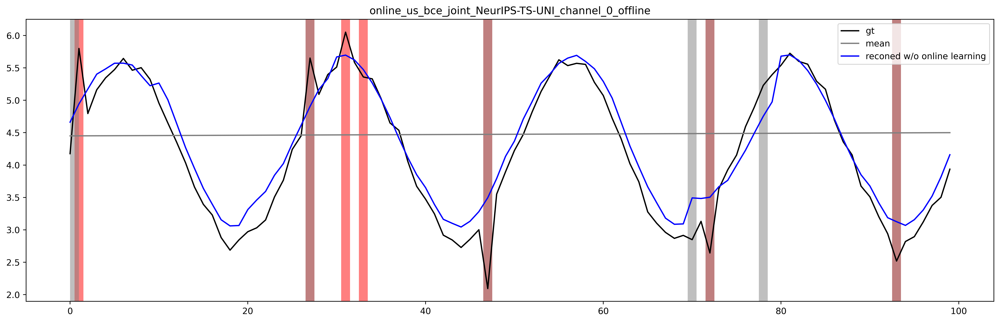

In [47]:
c=0
s, e = 8900, 9000
test_X, test_y = test_dataset.X, test_dataset.y

B, L, C = Xhats.shape

plt.figure(figsize=(20, 6), dpi=500)
plt.title(f"online_us_bce_joint_{args.dataset}_channel_{c}_offline")

plt.plot(test_X[s:e, c], color="black", label="gt")
plt.plot(Xmus[s:e, c], color="C7", label="mean")

plt.plot(Xhats_prev[:,:,c].reshape(-1)[s:e], color="blue", label="reconed w/o online learning")
plt.legend()
plot_interval(plt, test_y[s:e])
plot_interval(plt, (anoscs_prev > th_best_static)[s:e], facecolor="gray")
plt.show()

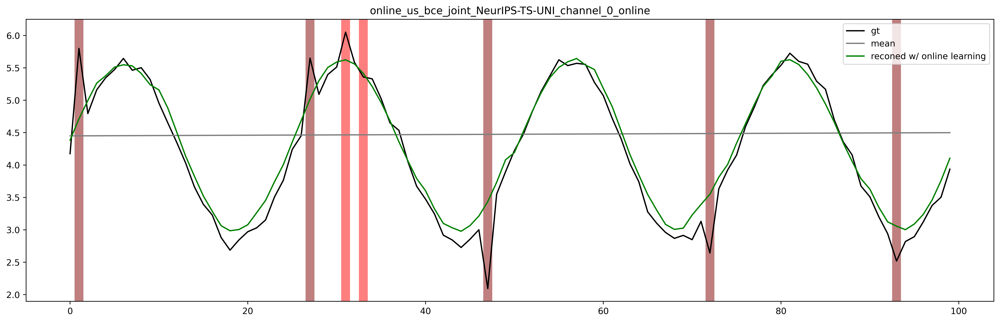

In [48]:
c=0
s, e = 8900, 9000
test_X, test_y = test_dataset.X, test_dataset.y

B, L, C = Xhats.shape

plt.figure(figsize=(20, 6), dpi=500)
plt.title(f"online_us_bce_joint_{args.dataset}_channel_{c}_online")

plt.plot(test_X[s:e, c], color="black", label="gt")
plt.plot(Xmus[s:e, c], color="C7", label="mean")

plt.plot(Xhats[:,:,c].reshape(-1)[s:e], color="green", label="reconed w/ online learning")
plt.legend()
plot_interval(plt, test_y[s:e])
plot_interval(plt, preds[s:e], facecolor="gray")
plt.show()

In [50]:
Zs_after = Zs.copy()
Zy_after = Zy.copy()
Zyt_after = Zyt.copy()

In [51]:
len(Zs_after)

1000

In [52]:
Z = np.concatenate([Zs_before, Zs_after])
Y = np.concatenate([Zy_before, Zy_after])
Yt = np.concatenate([Zyt_before, Zyt_after]).astype(int)

NameError: name 'Zs_before' is not defined

In [128]:
Y.shape

(2000,)

In [37]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, n_iter=300, perplexity=1)
tsne_v = tsne.fit_transform(Z)
t1x = tsne_v[:1000, 0]
t1y = tsne_v[:1000, 1]
t2x = tsne_v[1000:, 0]
t2y = tsne_v[1000:, 1]
Y1 = Y[:1000]
Y2 = Y[1000:]
Yt1 = Yt[:1000]
Yt2 = Yt[1000:]


# 1
plt.figure(figsize=(10, 10))

markers = ["o", "x"]
colors = ["C1", "C2"]
labels = ["normal", "anomaly"]
plotted = [False, False]
for x, y, label in zip(t1x, t1y, Y1):
    if plotted[label]:
        plt.scatter(x, y, color=colors[label], marker=markers[label], label="_hidden")
    else:
        plt.scatter(x, y, color=colors[label], marker=markers[label], label=f"{labels[label]}")
        plotted[label] = True

        
#plt.contourf([t1x, t1y], Yt1.tolist())
#plt.legend()
#plt.show()

# 2
plt.figure(figsize=(10, 10))
markers = ["o", "x"]
colors = ["C3", "C4"]
labels = ["normal", "anomaly"]
plotted = [False, False]
for x, y, label in zip(t2x, t2y, Y2):
    if plotted[label]:
        plt.scatter(x, y, color=colors[label], marker=markers[label], label="_hidden")
    else:
        plt.scatter(x, y, color=colors[label], marker=markers[label], label=f"{labels[label]}")
        plotted[label] = True
        


plt.legend()
plt.show()

NameError: name 'Z' is not defined

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, n_iter=300, perplexity=10)
tsne_v = tsne.fit_transform(Zs.astype("float64"))

tx = tsne_v[:, 0]
ty = tsne_v[:, 1]
plt.figure(figsize=(10, 10))

markers = ["o", "x"]
colors = ["C1", "red"]
# before
for x, y, label in zip(tx, ty, Zy):
    plt.scatter(x, y, color=colors[label], marker=markers[label], label="_hidden")
plt.scatter(x, y, color=colors[label], marker=markers[label], label="before")

plt.legend()
plt.show()

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.000s...
[t-SNE] Computed neighbors for 1000 samples in 0.013s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.000338
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.186131
[t-SNE] KL divergence after 300 iterations: 0.610072


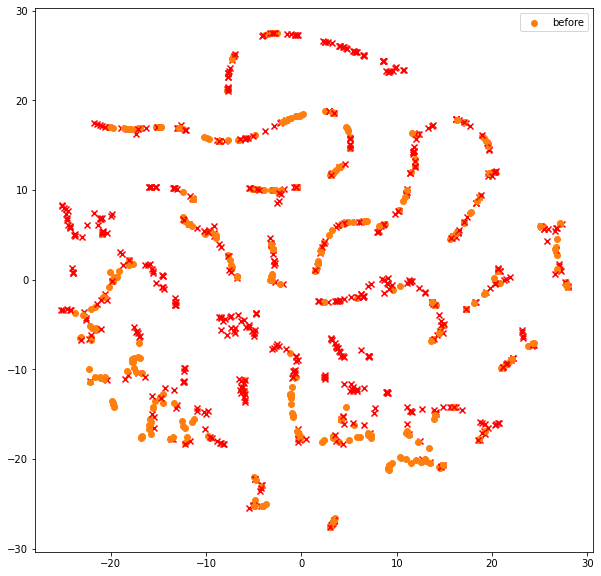

In [85]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, n_iter=300, perplexity=10)
tsne_v = tsne.fit_transform(Zs.astype("float64"))

tx = tsne_v[:, 0]
ty = tsne_v[:, 1]
plt.figure(figsize=(10, 10))

markers = ["o", "x"]
colors = ["C1", "red"]
# before
for x, y, label in zip(tx, ty, Zy):
    plt.scatter(x, y, color=colors[label], marker=markers[label], label="_hidden")
plt.scatter(x, y, color=colors[label], marker=markers[label], label="before")

plt.legend()
plt.show()

# vis

[t-SNE] Computing 10 nearest neighbors...
[t-SNE] Indexed 238 samples in 0.000s...
[t-SNE] Computed neighbors for 238 samples in 0.002s...
[t-SNE] Computed conditional probabilities for sample 238 / 238
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 108.539993
[t-SNE] KL divergence after 300 iterations: 2.588925


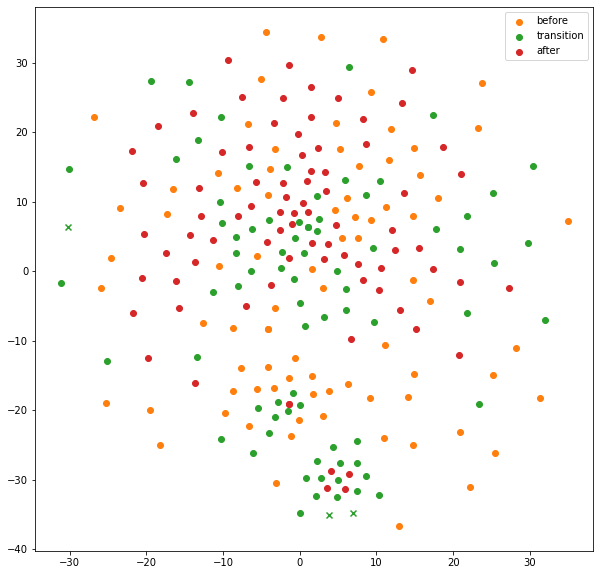

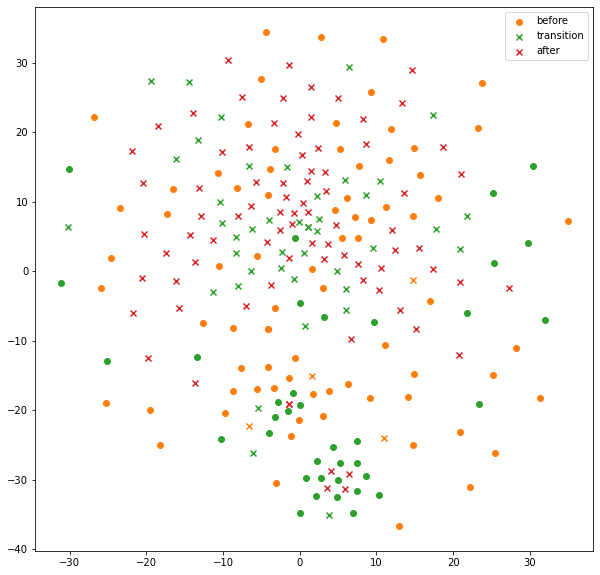

In [119]:
tsne = TSNE(n_components=2, verbose=1, n_iter=300, perplexity=3)
tsne_v = tsne.fit_transform(Zs.astype("float64"))

tx = tsne_v[:, 0]
ty = tsne_v[:, 1]

a, b = 79, 79*2
dx1, dy1, L1, P1 = tx[:a], ty[:a], Zy[:a].squeeze(1), Zyt[:a].squeeze(1)
dx2, dy2, L2, P2 = tx[a:b], ty[a:b], Zy[a:b].squeeze(1), Zyt[a:b].squeeze(1)
dx3, dy3, L3, P3 = tx[b:], ty[b:], Zy[b:].squeeze(1), Zyt[b:].squeeze(1)

plt.figure(figsize=(10, 10))

markers = ["o", "x"]
# before
for x, y, label in zip(dx1, dy1, L1):
    plt.scatter(x, y, color="C1", marker=markers[label], label="_hidden")
plt.scatter(x, y, color="C1", marker=markers[label], label="before")

# transition
for x, y, label in zip(dx2, dy2, L2):
    plt.scatter(x, y, color="C2", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C2", marker=markers[label], label="transition")

# after
for x, y, label in zip(dx3, dy3, L3):
    plt.scatter(x, y, color="C3", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C3", marker=markers[label], label="after")

plt.legend()
plt.show()



plt.figure(figsize=(10, 10))

markers = ["o", "x"]
# before
for x, y, label in zip(dx1, dy1, P1):
    plt.scatter(x, y, color="C1", marker=markers[label], label="_hidden")
plt.scatter(x, y, color="C1", marker=markers[label], label="before")

# transition
for x, y, label in zip(dx2, dy2, P2):
    plt.scatter(x, y, color="C2", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C2", marker=markers[label], label="transition")

# after
for x, y, label in zip(dx3, dy3, P3):
    plt.scatter(x, y, color="C3", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C3", marker=markers[label], label="after")

plt.legend()
plt.show()

## Value-based Pseudo-label guided Online Learning (separate threshold)

### 1. Single+CE

In [191]:
tester = MLP_Tester(
    args=args,
    logger=logger,
    train_loader=train_loader,
    test_loader=test_loader,
)
tester.load(os.path.join("./checkpoints/MLP_MSL_P-15_normalization_SlowRevIN", f"best.pth"))

[2023-04-29 23:03:57,862] loading: ./checkpoints/MLP_MSL_P-15_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict
[2023-04-29 23:03:57,868] train_errors.pt file exists, loading...
[2023-04-29 23:03:57,870] torch.Size([306, 12])
[2023-04-29 23:03:57,871] test_errors.pt file exists, loading...
[2023-04-29 23:03:57,873] torch.Size([238, 12])
[2023-04-29 23:03:57,876] loading: ./checkpoints/MLP_MSL_P-15_normalization_SlowRevIN/best.pth @Trainer - torch.load_state_dict


In [192]:
tester.model.normalizer.gamma = 0.5
tester.model.normalizer.gamma

0.5

In [193]:
tester.model

MLP(
  (encoder): Encoder(
    (linear1): Linear(in_features=660, out_features=330, bias=True)
    (relu1): ReLU()
    (linear2): Linear(in_features=330, out_features=165, bias=True)
    (relu2): ReLU()
    (linear3): Linear(in_features=165, out_features=16, bias=True)
    (relu3): ReLU()
  )
  (decoder): Decoder(
    (linear1): Linear(in_features=16, out_features=165, bias=True)
    (relu1): ReLU()
    (linear2): Linear(in_features=165, out_features=330, bias=True)
    (relu2): ReLU()
    (linear3): Linear(in_features=330, out_features=660, bias=True)
  )
  (normalizer): SlowRevIN()
)

In [194]:
th

6.669537544250488

In [195]:
eval_iterator = tqdm(
    tester.test_loader,
    total=len(tester.test_loader),
    desc="calculating reconstruction errors",
    leave=True
)

lr = 0.001
TT_optimizer = torch.optim.SGD([p for p in tester.model.parameters()], lr=lr)

Xs, Xhats = [], []
Xmus = []
yhats = []
preds = []
As, thrs =[], []


Zs = []
Zyt = []
Zy = []

for i, batch_data in enumerate(eval_iterator):
    X, y = batch_data[0].to(tester.args.device), batch_data[1].to(tester.args.device)
    B, L, C = X.shape
    
    # inference
    tester.model.normalizer._update_statistics(X)
    
    Xhat = tester.model(X)
    E = (Xhat-X)**2
    A = E.mean(dim=2)
    ytilde = (A > th).float()
    pred = ytilde
    
    with torch.no_grad():
        _nX = tester.model.normalizer(X, "norm") 
        z = tester.model.encoder(_nX.reshape(B, L*C))
        zytilde = np.array([1 in ytilde])
        zy = np.array([1 in y])
        Zs.append(z)
        Zyt.append(zytilde)
        Zy.append(zy)
        
        
    # log source model outputs
    Xs.append(X)
    Xmus.append(tester.model.normalizer.mean.clone().detach().repeat(1,L,1))
    Xhats.append(Xhat.clone().detach())
    As.append(A.clone().detach())
    preds.append(pred.clone().detach())
    thrs.append(th)
    
    # learn new-normals
    TT_optimizer.zero_grad()
    mask = (ytilde == 0)
    recon_loss = (A*mask).mean()
    recon_loss.backward()
    
    TT_optimizer.step()
    
    
Xs = torch.cat(Xs, axis=0).detach().cpu().numpy()    
Xhats = torch.cat(Xhats, axis=0).detach().cpu().numpy()
Xmus = torch.cat(Xmus, axis=0).detach().cpu().numpy().reshape(-1, args.num_channels)

anoscs = torch.cat(As, axis=0).reshape(-1).detach().cpu().numpy()
thrs = np.repeat(np.array(thrs), args.window_size*args.eval_batch_size)
preds = torch.cat(preds).reshape(-1).detach().cpu().numpy()

Zs = torch.cat(Zs, axis=0).cpu().numpy()
Zyt = np.stack(Zyt)
Zy = np.stack(Zy)

calculating reconstruction errors: 100%|██████████| 238/238 [00:00<00:00, 266.68it/s]


In [196]:
print(test_y.shape, preds.shape)
single_CE = get_summary_stats(test_y, preds)
print(single_CE)

(2856,) (2856,)
{'Accuracy': 0.9947478991596639, 'Precision': 0.631578947368421, 'Recall': 0.6, 'F1': 0.6153846153846154, 'tn': 2829, 'fp': 7, 'fn': 8, 'tp': 12, 'Accuracy_PA': 0.9975490196078431, 'Precision_PA': 0.7407407407407407, 'Recall_PA': 1.0, 'F1_PA': 0.851063829787234, 'tn_PA': 2829, 'fp_PA': 7, 'fn_PA': 0, 'tp_PA': 20}


[t-SNE] Computing 10 nearest neighbors...
[t-SNE] Indexed 238 samples in 0.000s...
[t-SNE] Computed neighbors for 238 samples in 0.003s...
[t-SNE] Computed conditional probabilities for sample 238 / 238
[t-SNE] Mean sigma: 0.016232
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.094231
[t-SNE] KL divergence after 300 iterations: 0.854115


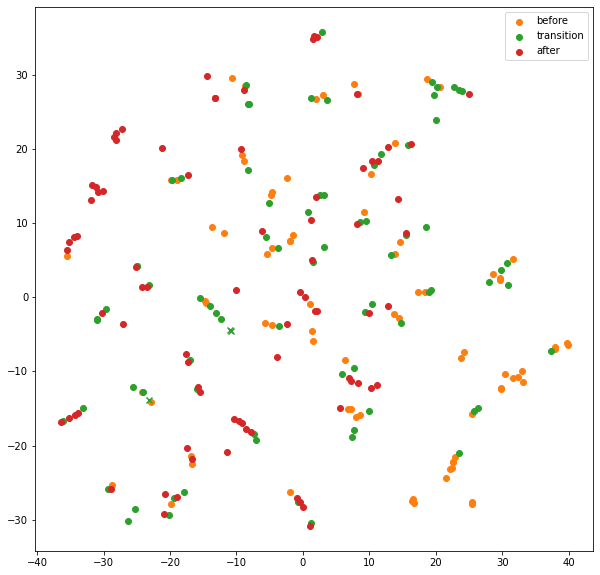

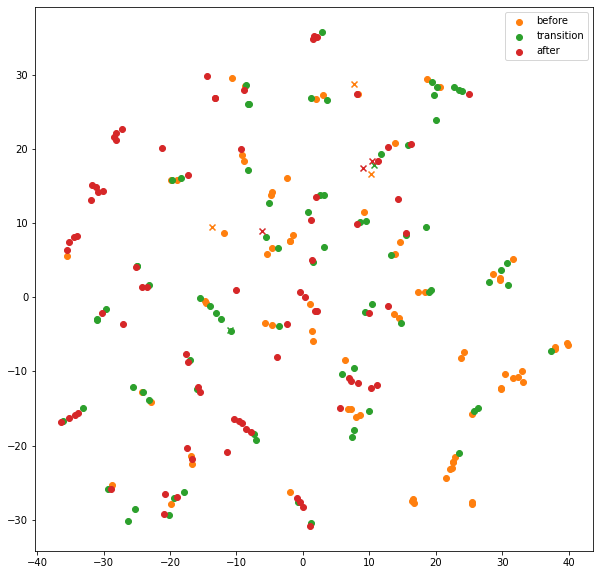

In [197]:
tsne = TSNE(n_components=2, verbose=1, n_iter=300, perplexity=3)
tsne_v = tsne.fit_transform(Zs.astype("float64"))

tx = tsne_v[:, 0]
ty = tsne_v[:, 1]

a, b = 79, 79*2
dx1, dy1, L1, P1 = tx[:a], ty[:a], Zy[:a].squeeze(1), Zyt[:a].squeeze(1)
dx2, dy2, L2, P2 = tx[a:b], ty[a:b], Zy[a:b].squeeze(1), Zyt[a:b].squeeze(1)
dx3, dy3, L3, P3 = tx[b:], ty[b:], Zy[b:].squeeze(1), Zyt[b:].squeeze(1)

plt.figure(figsize=(10, 10))

markers = ["o", "x"]
# before
for x, y, label in zip(dx1, dy1, L1):
    plt.scatter(x, y, color="C1", marker=markers[label], label="_hidden")
plt.scatter(x, y, color="C1", marker=markers[label], label="before")

# transition
for x, y, label in zip(dx2, dy2, L2):
    plt.scatter(x, y, color="C2", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C2", marker=markers[label], label="transition")

# after
for x, y, label in zip(dx3, dy3, L3):
    plt.scatter(x, y, color="C3", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C3", marker=markers[label], label="after")

plt.legend()
plt.show()



plt.figure(figsize=(10, 10))

markers = ["o", "x"]
# before
for x, y, label in zip(dx1, dy1, P1):
    plt.scatter(x, y, color="C1", marker=markers[label], label="_hidden")
plt.scatter(x, y, color="C1", marker=markers[label], label="before")

# transition
for x, y, label in zip(dx2, dy2, P2):
    plt.scatter(x, y, color="C2", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C2", marker=markers[label], label="transition")

# after
for x, y, label in zip(dx3, dy3, P3):
    plt.scatter(x, y, color="C3", marker=markers[label], label="_hidden")

plt.scatter(x, y, color="C3", marker=markers[label], label="after")

plt.legend()
plt.show()

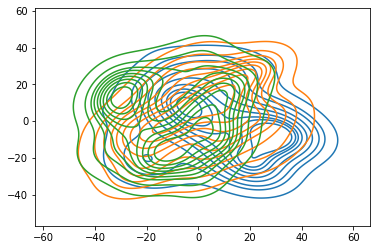

In [198]:
sns.kdeplot(dx1, dy1)
#plt.show()
sns.kdeplot(dx2, dy2)
#plt.show()
sns.kdeplot(dx3, dy3)
plt.show()

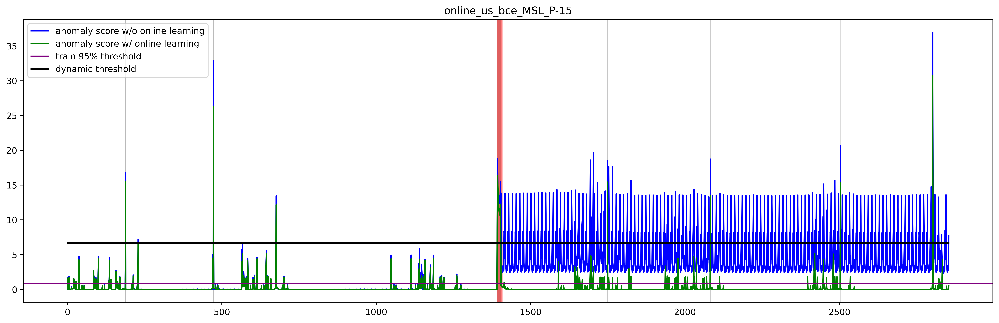

In [199]:
#s, e = 26751, 26851
s, e = 0, -1
plt.figure(figsize=(20, 6), dpi=500)
plt.title(f"online_us_bce_{args.dataset}")
#plt.ylim([-1, 10])
plt.plot(anoscs_prev[s:e], color="blue", label="anomaly score w/o online learning")
plt.plot(anoscs[s:e], color="green", label="anomaly score w/ online learning")
plt.axhline(th_q95, color="purple", label="train 95% threshold")
plt.plot(thrs[s:e], color="black",label="dynamic threshold")

plot_interval(plt, preds.astype(int)[s:e], facecolor="gray", alpha=0.5)
plot_interval(plt, test_y[s:e])
plt.legend()
plt.show()

In [201]:
Xmus.shape

(2856, 55)

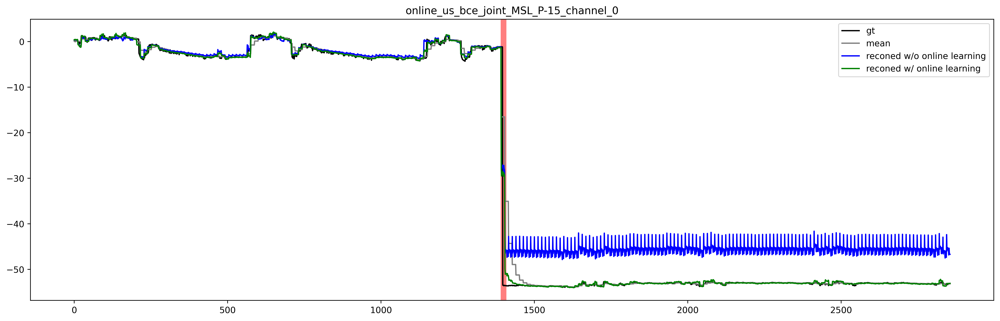

In [202]:
# plot recon
c = 0
for c in range(args.num_channels):
    test_X, test_y = test_dataset.X, test_dataset.y

    B, L, C = Xhats.shape

    plt.figure(figsize=(20, 6), dpi=500)
    plt.title(f"online_us_bce_joint_{args.dataset}_channel_{c}")

    plt.plot(test_X[:, c], color="black", label="gt")
    plt.plot(Xmus[:, c], color="C7", label="mean")
    
    plt.plot(Xhats_prev[:,:,c].reshape(-1), color="blue", label="reconed w/o online learning")
    plt.plot(Xhats[:,:,c].reshape(-1), color="green", label="reconed w/ online learning")
    plt.legend()
    plot_interval(plt, test_y)
    break